In [27]:
import base64
from io import BytesIO
import numpy as np
from PIL import Image, ImageFilter

In [16]:
im = Image.open('../images/IU2.jpg')
arr = np.asarray(im)

buff = BytesIO()
im.save(buff, format='bmp')
encoded = base64.b64encode(buff.getvalue()).decode("utf-8")

decoded = base64.b64decode(encoded)
buffer = BytesIO(decoded)
ret_im = Image.open(buffer)

ret_arr = np.asarray(ret_im)

print(np.count_nonzero(arr == ret_arr))
print(np.count_nonzero(arr != ret_arr))

24883200
0


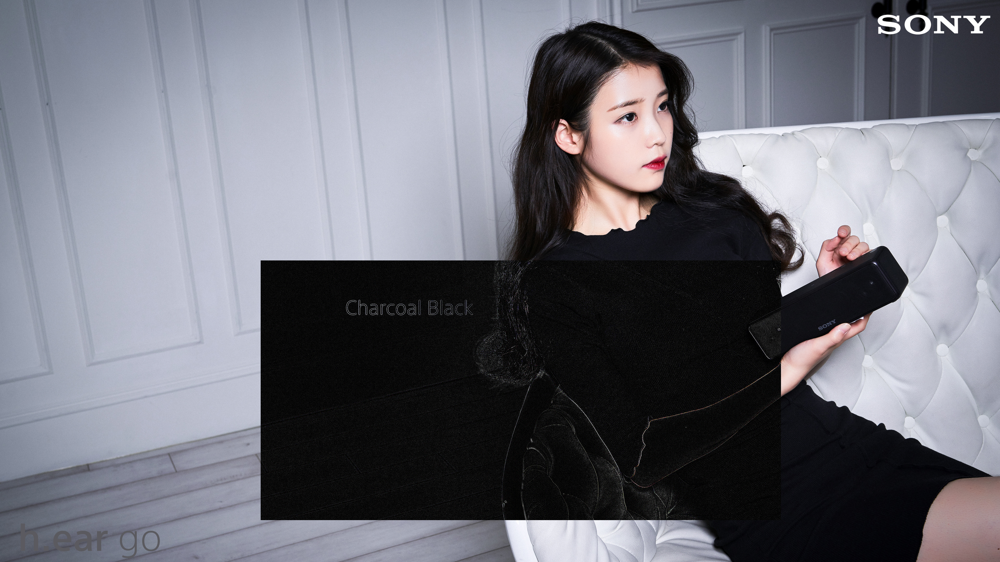

In [50]:
im_copy = im.copy()

box = (1000, 1000, 3000, 2000)
crop = im.crop(box)
crop_mod = crop.filter(ImageFilter.FIND_EDGES)
im_copy.paste(crop_mod, box)
im_copy